In [1]:
#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('gzh_3_23_with_urls.fits')

#current threshold values:
cuts=Table.read('gzh_cuts.fits')
p_features_cut=cuts['p_features_cut'][0]
p_clumpy_no_cut=cuts['p_clumpy_no_cut'][0]


# Task 03: Is there a sign of a bar feature through the center of the galaxy?
# Task 04: Is there any sign of a spiral arm pattern?
# Task 05: How prominent is the central bulge, compared with the rest of the galaxy? 


All of the above have identical previous tasks: 

Task 01: Is the galaxy smooth or featured? (answer featured) 

Task 12: Does the galaxy have a mostly clumpy appearance? (answer no) 

T02: Could this be a disk viewed edge-on? (answer no)

In [2]:
# Task 3:  Bar

#First define the task in question:
p_bar_yes = 't03_bar_a01_bar_weighted_fraction' # vote fraction for task
N_bar = 't03_bar_total_weight' # number of votes for task

#and the previous tasks:
p_features = 't01_smooth_or_features_a02_features_or_disk_best_fraction' # vote fraction for previous task
p_clumpy_no = 't12_clumpy_a02_no_weighted_fraction' # vote fraction for previous task
p_edgeon_no = 't02_edgeon_a02_no_weighted_fraction' # vote fraction for previous task
N_edgeon = 't02_edgeon_total_weight' # number of votes for previous task

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_bar]>=N_cut)

featured = (data[p_features]>p_features_cut)
not_clumpy = (data[p_clumpy_no]>p_clumpy_no_cut)


# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_bar=[]
err_list_bar=[]


for p in p_prev_task_list:
    task_data = (data[p_edgeon_no]>p-.05) & (data[p_edgeon_no]<p+.05) & min_N & featured & not_clumpy

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_bar.append(np.nanmean(data[task_data][p_bar_yes]))


    try:
        err_list_bar.append(np.nanstd(data[task_data][p_bar_yes])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_bar.append(0)


y1_bar = [f+e for f,e in zip(fraction_list_bar,err_list_bar)]
y2_bar = [f-e for f,e in zip(fraction_list_bar,err_list_bar)]

# Task 4:  Spiral arm yes/no

#First define the task in question:
p_spiral = 't04_spiral_a01_spiral_fraction' # vote fraction for task
N_spiral = 't04_spiral_total_weight' # number of votes for task

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_spiral]>=N_cut)

# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_spiral=[]
err_list_spiral=[]


for p in p_prev_task_list:
    task_data = (data[p_edgeon_no]>p-.05) & (data[p_edgeon_no]<p+.05) & min_N & featured & not_clumpy

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_spiral.append(np.nanmean(data[task_data][p_spiral]))


    try:
        err_list_spiral.append(np.nanstd(data[task_data][p_spiral])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_spiral.append(0)


y1_spiral = [f+e for f,e in zip(fraction_list_spiral,err_list_spiral)]
y2_spiral = [f-e for f,e in zip(fraction_list_spiral,err_list_spiral)]

# Task 05: Bulge Prominence 


#First define the task in question:
p_dominant = 't05_bulge_prominence_a04_dominant_weighted_fraction' # vote fraction for task
p_obvious = 't05_bulge_prominence_a03_obvious_weighted_fraction'
p_jn = 't05_bulge_prominence_a02_just_noticeable_weighted_fraction'
p_no_bulge = 't05_bulge_prominence_a01_no_bulge_weighted_fraction' # vote fraction for task
N_bulge_prom = 't05_bulge_prominence_total_weight' # number of votes for task

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N =  (data[N_bulge_prom]>=N_cut)

# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_dom=[]
err_list_dom=[]
fraction_list_obv=[]
err_list_obv=[]
fraction_list_jn=[]
err_list_jn=[]
fraction_list_nb=[]
err_list_nb=[]


for p in p_prev_task_list:
    task_data = (data[p_edgeon_no]>p-.05) & (data[p_edgeon_no]<p+.05) & min_N & featured & not_clumpy

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_dom.append(np.nanmean(data[task_data][p_dominant]))
    fraction_list_obv.append(np.nanmean(data[task_data][p_obvious]))
    fraction_list_jn.append(np.nanmean(data[task_data][p_jn]))
    fraction_list_nb.append(np.nanmean(data[task_data][p_no_bulge]))


    try:
        err_list_dom.append(np.nanstd(data[task_data][p_dominant])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_dom.append(0)
    try:
        err_list_obv.append(np.nanstd(data[task_data][p_obvious])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_obv.append(0)
    try:
        err_list_jn.append(np.nanstd(data[task_data][p_jn])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_jn.append(0)
    try:
        err_list_nb.append(np.nanstd(data[task_data][p_no_bulge])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_nb.append(0)


y1_dom = [f+e for f,e in zip(fraction_list_dom,err_list_dom)]
y2_dom = [f-e for f,e in zip(fraction_list_dom,err_list_dom)]

y1_obv = [f+e for f,e in zip(fraction_list_obv,err_list_obv)]
y2_obv = [f-e for f,e in zip(fraction_list_obv,err_list_obv)]

y1_jn = [f+e for f,e in zip(fraction_list_jn,err_list_jn)]
y2_jn = [f-e for f,e in zip(fraction_list_jn,err_list_jn)]

y1_nb = [f+e for f,e in zip(fraction_list_nb,err_list_nb)]
y2_nb = [f-e for f,e in zip(fraction_list_nb,err_list_nb)]

/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:1136: RuntimeWarning: Degrees of freedom <= 0 for slice.
  warnings.warn("Degrees of freedom <= 0 for slice.", RuntimeWarning)


/usr/local/lib/python2.7/dist-packages/numpy/ma/core.py:4089: UserWarning: Warning: converting a masked element to nan.
  warnings.warn("Warning: converting a masked element to nan.")


(0, 1)

/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


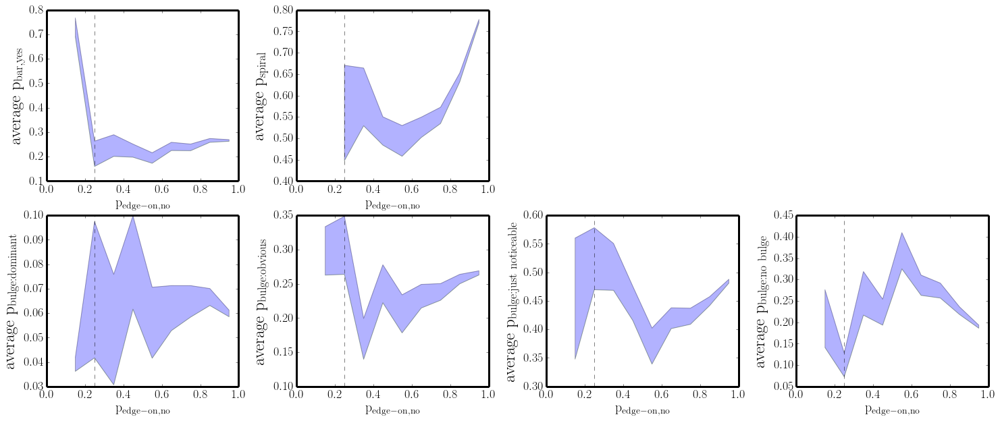

In [3]:
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

p_edgeon_no_cut = 0.25

f=plt.figure(figsize=(25,10))
gs=gridspec.GridSpec(2,4)
gs.update(wspace=.3)

plt.subplot(gs[0,0])
plt.plot(p_prev_task_list,y1_bar,alpha=.1)
plt.plot(p_prev_task_list,y2_bar,alpha=.1)
plt.fill_between(p_prev_task_list,y1_bar,y2_bar,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{bar,yes}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{edge-on,no}}$',fontsize=20)
plt.axvline(x=p_edgeon_no_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)

plt.subplot(gs[0,1])
plt.plot(p_prev_task_list,y1_spiral,alpha=.1)
plt.plot(p_prev_task_list,y2_spiral,alpha=.1)
plt.fill_between(p_prev_task_list,y1_spiral,y2_spiral,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{spiral}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{edge-on,no}}$',fontsize=20)
plt.axvline(x=p_edgeon_no_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)

plt.subplot(gs[1,0])
plt.plot(p_prev_task_list,y1_dom,alpha=.1)
plt.plot(p_prev_task_list,y2_dom,alpha=.1)
plt.fill_between(p_prev_task_list,y1_dom,y2_dom,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{bulge:dominant}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{edge-on,no}}$',fontsize=20)
plt.axvline(x=p_edgeon_no_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)

plt.subplot(gs[1,1])
plt.plot(p_prev_task_list,y1_obv,alpha=.1)
plt.plot(p_prev_task_list,y2_obv,alpha=.1)
plt.fill_between(p_prev_task_list,y1_obv,y2_obv,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{bulge:obvious}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{edge-on,no}}$',fontsize=20)
plt.axvline(x=p_edgeon_no_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)

plt.subplot(gs[1,2])
plt.plot(p_prev_task_list,y1_jn,alpha=.1)
plt.plot(p_prev_task_list,y2_jn,alpha=.1)
plt.fill_between(p_prev_task_list,y1_jn,y2_jn,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{bulge:just~noticeable}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{edge-on,no}}$',fontsize=20)
plt.axvline(x=p_edgeon_no_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)

plt.subplot(gs[1,3])
plt.plot(p_prev_task_list,y1_nb,alpha=.1)
plt.plot(p_prev_task_list,y2_nb,alpha=.1)
plt.fill_between(p_prev_task_list,y1_nb,y2_nb,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{bulge:no~bulge}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{edge-on,no}}$',fontsize=20)
plt.axvline(x=p_edgeon_no_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)


## Below: Visually inspect galaxies for "bar/spiral/bulge candidates" - galaxies for which asking the bar/spiral/bulge questions make physical sense. These should be not edge-on disks.

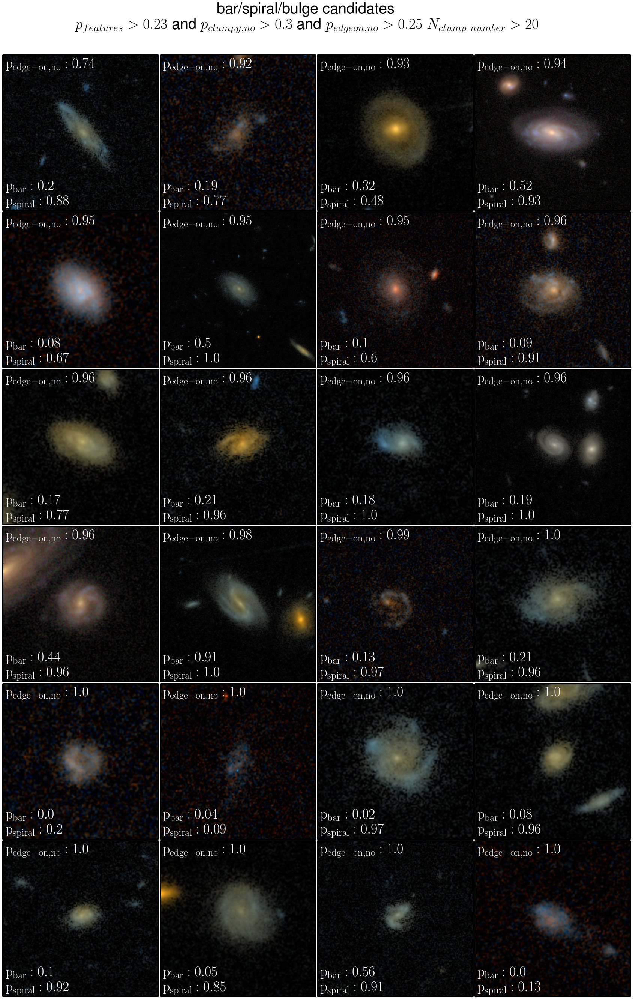

In [4]:
not_edge_on=(data[p_edgeon_no]>p_edgeon_no_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & not_clumpy & not_edge_on & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_edgeon_no, column 24
random_gal_list.sort(key=itemgetter(24))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{edge-on,no}: %s}$'%round(gal[p_edgeon_no],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{bar}: %s}$\n$\mathrm{p_{spiral}: %s}$'%(round(gal[p_bar_yes],2),round(gal[p_spiral],2)),fontsize=38,xy=(0.02,.02),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'bar/spiral/bulge candidates\n$p_{features} > %s$~and~$p_{clumpy,no}>%s$ and $p_{edgeon,no}>%s$ $N_{clump~number}>20$'%(p_features_cut,p_clumpy_no_cut,p_edgeon_no_cut), fontsize=40,ha='center')





try new values


IndexError: list index out of range

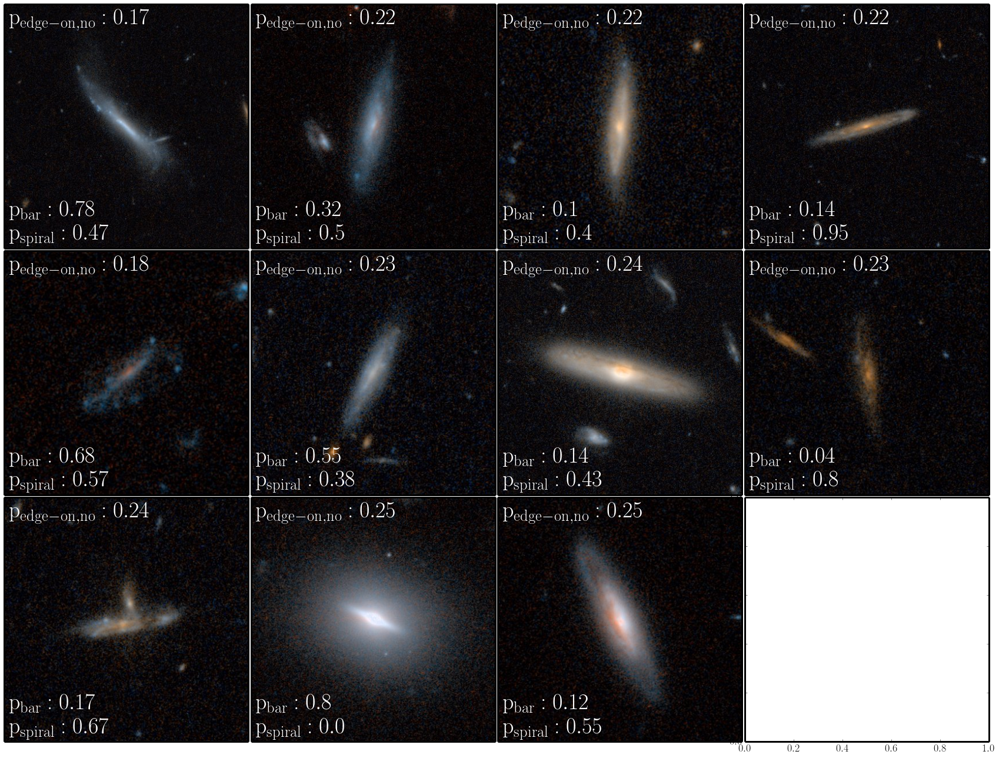

In [5]:
edge_on=(data[p_edgeon_no]<p_edgeon_no_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & not_clumpy & edge_on & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_edgeon_no, column 24
random_gal_list.sort(key=itemgetter(24))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{edge-on,no}: %s}$'%round(gal[p_edgeon_no],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{bar}: %s}$\n$\mathrm{p_{spiral}: %s}$'%(round(gal[p_bar_yes],2),round(gal[p_spiral],2)),fontsize=38,xy=(0.02,.02),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'Control Sample: non bar/spiral/bulge candidates\n$p_{features} > %s$~and~$p_{clumpy,no}>%s$ and $p_{edgeon,no}<%s$ $N_{clump~number}>20$'%(p_features_cut,p_clumpy_no_cut,p_edgeon_no_cut), fontsize=40,ha='center')





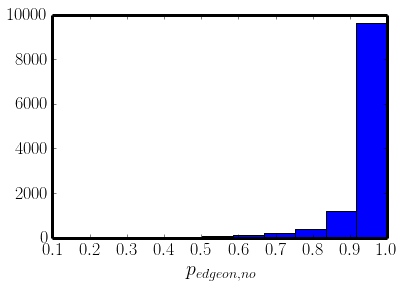

In [7]:
plt.hist(data[featured & not_clumpy & min_N][p_edgeon_no])
plt.xlabel('$p_{edgeon,no}$',fontsize=20)

## Featured, non-clumpy galaxies which have at least 20 answers to the bar/spiral/bulge questions are rarely not-edge-on; a cut of p_notedgeon>0.25 is sufficient. 

In [8]:
cuts['p_edgeon_no_cut']=p_edgeon_no_cut

newtable = cuts.copy(copy_data=True)
fname = 'gzh_cuts.fits'
if os.path.exists(fname):
    os.remove(fname)
newtable.write(fname,format='fits')